# PopCILA for Single-Cell RNA-seq: Phenotype-Guided CCI Discovery

## Phenotype-associated LRI discovery

This tutorial walks you through using PopCILA to discover phenotype-associated ligand–receptor interactions (LRIs) from cohort-scale bulk transcriptomic data.

To get started, prepare (i) a bulk gene expression matrix and (ii) the corresponding sample-level phenotype annotations. PopCILA supports binary, continuous, ordinal, and right-censored survival phenotype types.

See our manuscript for additional background and methodological details.

### import

In [1]:
import warnings
warnings.filterwarnings("ignore")
import PopCILA as pc
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

### Loading Bulk data and data processing

First, we load the bulk data and its corresponding clinical meta-data. Note that the expression matrix we load should have samples as columns and genes as rows, while the clinical meta-file should have sample as rows and clinical informations as columns.

In [2]:
expr_df = pd.read_csv('data/CRC_expr.csv', header=0, index_col=0) 
clin_df = pd.read_csv('data/CRC_clinical_meta.csv',index_col=0, header=0)

Next, we use PopCILA to filter the bulk expression matrix: We select genes that express ligands and receptors, and filter out genes with an average expression level below 1 (log2(tpm+1)).

In [3]:
lr_expr_pairs, lr_expr_df = pc.filter_Bulkdata(expr_df,threshold=1)

Note: Of course, you can provide PopCILA with a customized ligand-receptor database according to your needs, and choose whether to filter out lowly expressed genes. The ligand-receptor database you provide should be in CSV format and must have two columns named "ligand" and "receptor".

In [ ]:
lr_expr_pairs, lr_expr_df = pc.filter_Bulkdata(bulk_data = expr_df,lr_db_path = "Human-2020-Cabello-Aguilar-LR-pairs.csv")

Next, we process the sample metadata to obtain the phenotypic constraints and other relevant information required for PopCILA analysis. 

For binary phenotype, run the following code:

In [4]:
S, Y, lr_expr_df, phenotype_interval, clin_df = pc.getBinaryConstraint(
    clin_df=clin_df,
    lr_expr_df=lr_expr_df,
    by='tissue_type', #The column names of the phenotypes we focused in clin_df
    phenotype_of_interest='Tumor' #The phenotype we concerned in the column
    )

**Note:** S is the phenotypic constraint used by PopCILA to identify LRIs, and Y is the phenotypic constraint used to identify CCIs (used later in downstream projection step to identify phenotype-associated CCIs / CCI-active cells or spots).

For continuous phenotype, run the following code:

In [ ]:
S = pc.getLinearConstraint(
    clin_df,
    by = 'HFD-45' #The column names of the phenotypes we focused in clin_df
    ) 
Y = clin_df.loc[lr_expr_df.columns]['HFD-45'].values.reshape(-1, 1)

For ordinal phenotype, run the following code:

In [ ]:
S, Y, lr_expr_df, phenotype_interval, clin_df = pc.getOrderedConstraint(
    clin_df=clin_df,
    lr_expr_df=lr_expr_df,
    by='ajcc_pathologic_stage.diagnoses', #The column names of the phenotypes we focused in clin_df
)

**Note:** Before processing ordinal variables, PopCILA requires them to be converted into integer-valued numeric variables starting from 1. For example,'Stage I' can be converted to 1, 'Stage II' can be converted to 2 and 'Stage III' can be converted to 3. 

For survival phenotype, run the following code:

In [ ]:
S = pc.getProgConstraint(
    clin_df,
    interest=1 #interest=1 indicates focusing on poorer prognoses, while interest=0 indicates the opposite.
    )
time, event = pc.getCoxelement(clin_df) #time and event are the phenotypic constraint used to identify CCI.

**Note:** clin_df must include the columns 'OS.time'(survival time) and 'OS'(survival state), and the sample order should match that of the bulk expression matrix. In addition, PopCILA.getProgConstraint function would converts survival-related phenotypes into a linearized score using the complete rank method and adds it to clin_df for association analysis.

### Building Communication Potential Matrix

In [5]:
comm_matrix = pc.build_communication_matrix(lr_expr_pairs, lr_expr_df)

### Identify phenotype-associated LRIs

Before performing phenotype-associated LRI analysis using PopCILA, we need to estimate the number of potential biological patterns in this bulk cohort using the elbow method. Users can control the number of identified potential biological patterns by adjusting the elbow point (eii_tol). PopCILA defaults to an eii_tol value of 0.05. 

In [6]:
optimal_K = pc.select_k_components(X = comm_matrix.T.values.astype(float), S=S, lambda_pheno=0.10, lambda_en=0.05, eii_tol = 0.05,verbose=True) 
print(optimal_K)

[K=2] recon_err=0.549061
[K=3] recon_err=0.470037
[K=4] recon_err=0.414132
   eii=0.4143
[K=5] recon_err=0.380673
   eii=0.1987
[K=6] recon_err=0.354793
   eii=0.1332
[K=7] recon_err=0.334450
   eii=0.0948
[K=8] recon_err=0.320938
   eii=0.0592
[K=9] recon_err=0.307373
   eii=0.0561
[K=10] recon_err=0.295502
   eii=0.0468
[Elbow] Stop at K=10, select K=9
9


Then, we execute PopCILA to perform phenotype-guided decomposition of the signaling potential matrix to identify specific signaling patterns.

In [7]:
W, H, hist = pc.LRcommMining(X = comm_matrix.T.values.astype(float), S=S, n_components=optimal_K, rho=0.75, lambda_pheno=0.10, lambda_en=0.05,maxiter=8000)

[Balance] alpha=0.356612, beta=0.0203561 (targets: pheno=0.1, en=0.05)
Iteration 0/8000, Loss: 0.357114
Iteration 200/8000, Loss: 0.350977
Iteration 400/8000, Loss: 0.346527
Iteration 600/8000, Loss: 0.343047
Iteration 800/8000, Loss: 0.340290
Iteration 1000/8000, Loss: 0.338098
Iteration 1200/8000, Loss: 0.336356
Iteration 1400/8000, Loss: 0.335013
Iteration 1600/8000, Loss: 0.334018
Iteration 1800/8000, Loss: 0.333290
Iteration 2000/8000, Loss: 0.332745
Iteration 2200/8000, Loss: 0.332327
Iteration 2400/8000, Loss: 0.332000
Iteration 2600/8000, Loss: 0.331732
Iteration 2800/8000, Loss: 0.331500
Iteration 3000/8000, Loss: 0.331288
Iteration 3200/8000, Loss: 0.331082
Iteration 3400/8000, Loss: 0.330875
Iteration 3600/8000, Loss: 0.330665
Iteration 3800/8000, Loss: 0.330455
Iteration 4000/8000, Loss: 0.330242
Iteration 4200/8000, Loss: 0.330029
Iteration 4400/8000, Loss: 0.329819
Early stopped at iter 4546 (patience=20)


Using the association analysis provided by PopCILA, we can evaluate which patterns are more relevant to the phenotypes of interest.

**Note:** It is important to note that the association analysis provided by PopCILA requires that the phenotype column in the input, i.e., the phenotype column in clinical meta-data, must be a numerical variable. Therefore, we recommend that users convert phenotypes to numerical values in the clinical meta-data in advance. For example, 'Tumor' can be converted to 1, and 'Normal' can be converted to 0.  'Stage I' can be converted to 1, 'Stage II' can be converted to 2 and 'Stage IV' can be converted to 4. Finally, PopCILA considers a positive correlation to be more related to phenotypes with higher numerical values.

For binary phenotype, run the following code:

In [8]:
phenotype_types = {"tissue_type_num": "binary"} #The column name of the phenotype in clin_df: The type of the phenotype ("binary","continuous","ordinal")

For continuous phenotype, run the following code:

In [ ]:
phenotype_types = {"HFD-45": "continuous"} #The column name of the phenotype in clin_df: The type of the phenotype ("binary","continuous","ordinal")

For ordinal phenotype, run the following code:

In [ ]:
phenotype_types = {"ajcc_pathologic_stage.diagnoses": "ordinal"}  #The column name of the phenotype in clin_df: The type of the phenotype ("binary","continuous","ordinal")                 

For survival phenotype, run the following code:

In [ ]:
phenotype_types = {"completerank": "continuous"}#The column name of the phenotype in clin_df: The type of the phenotype ("binary","continuous","ordinal")

**Note:** The completerank attribute is a linear variable derived from OS and OS.time using the PopCILA.getProgConstraint function, and it is stored in clin_df.

/home/yangyoupeng/anaconda3/envs/torch/lib/python3.10/site-packages/statsmodels/discrete/discrete_model.py:227: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/home/yangyoupeng/anaconda3/envs/torch/lib/python3.10/site-packages/statsmodels/discrete/discrete_model.py:227: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/home/yangyoupeng/anaconda3/envs/torch/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


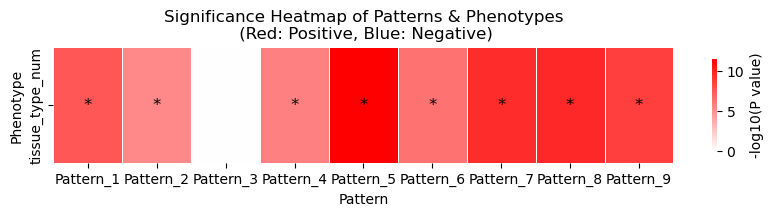

In [9]:
result = pc.Singleassociationanalysis(W, clin_df, phenotype_types)
pc.plot_significance_heatmap(result)

For binary phenotype and ordinal phenotype, PopCILA’s association analysis additionally integrates complementary evidence from
visualization-based analyses

We visualize the distribution of pattern scores for each signaling pattern obtained from the PopCILA. 

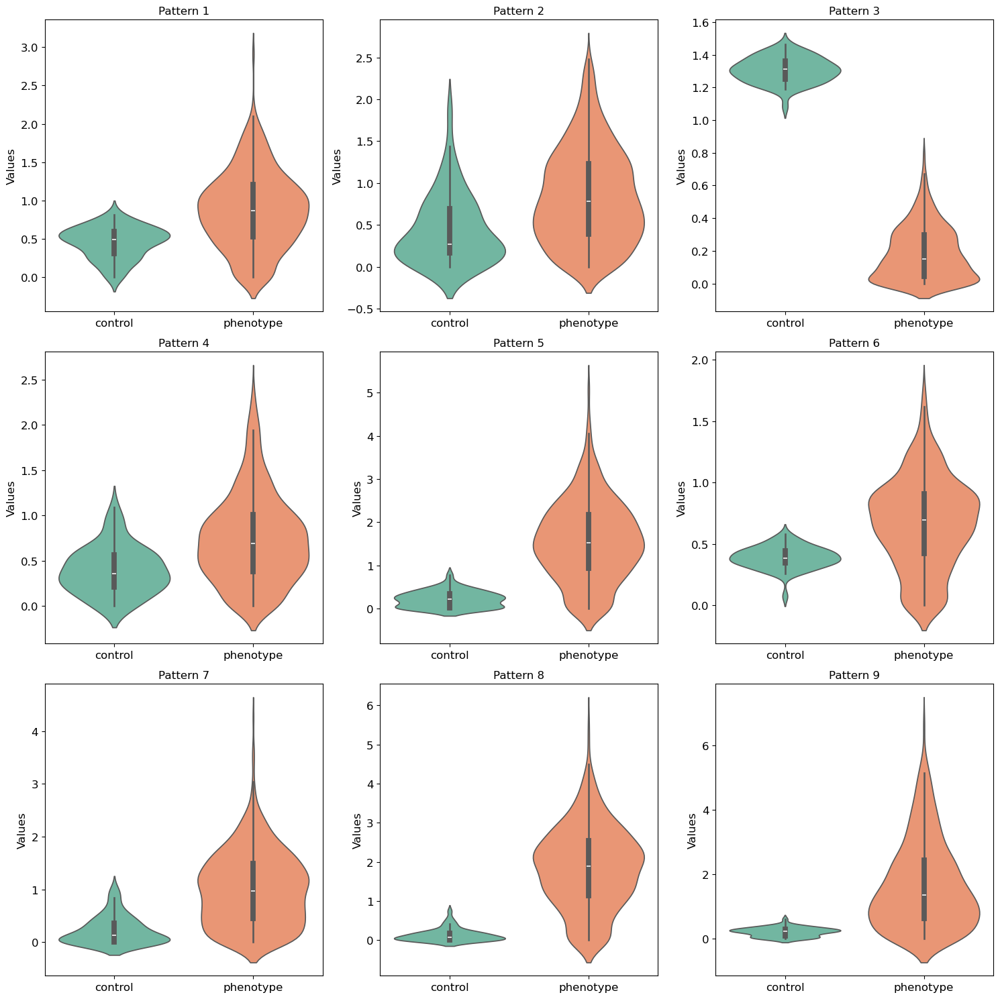

In [10]:
pc.getPatternDistribution(W, phenotype_interval = phenotype_interval)

We recommend users to identify phenotype-asscoiated patterns by combining both visualization-based and regression-based result.

In [11]:
res = pc.getLRcomm(W,H,comm_matrix,
                   patterns = [1,2,4,5,6,7,8,9], 
                   lr_expr_pairs = lr_expr_pairs,
                   zscore_threshold = 2.5
                  )

**Note:** Users can flexibly adjust zscore_threshold to control the number of LRIs identified by PopCILA. By default, PopCILA sets zscore_threshold = 2.

In [12]:
pc.plot_sankey(res, width=800, height=600, font_size=20)

## Phenotype-associated CCI discovery

Guided by the phenotypic information, PopCILA will project these LRIs into single-cell to uncover how they manifest as specific cell–cell interaction (CCI) events within the tissue context that underlie phenotypic variation.

### Loading scRNA-seq data and data processing

In [13]:
#We recommend that users normalize their data using log(TPM+1) transformation.
adata = sc.read_h5ad("data/CRC.h5ad")

To perform single-cell analysis with PopCILA, we need to calculate the cell adjacency matrix to constrain the analysis. Scanpy provides the sc.pp.neighbors function to compute the similarity matrix stored in adata.obsp['connectivities']. After computing adata.obsp['connectivities'], we can use PopCILA to convert it into a cell adjacency matrix.

In [14]:
cell_adj = pc.similarity2adjacent(adata, key='connectivities')

Filtering the genes in the scRNA-seq data based on the phenotype-associated Ligand-Receptor genes identified by PopCILA, we obtain the ligand-receptor expression vectors for each cell. We then calculate the pairwise correlation with the ligand-receptor expression vectors of the bulk samples.

In [15]:
sc_lr_expr_df, sc_lr_expr_pairs = pc.filter_scRNAdata(res, adata, label = 'Major Cell type')#The label is preferably an attribute in adata.obs that identifies cell types. If not available, any other attribute can be specified (the choice of label does not affect the results).
print("Expression matrix shape:", sc_lr_expr_df.shape)
X = pc.calculate_correlation_matrix(lr_expr_df, sc_lr_expr_df)

Expression matrix shape: (163, 323702)
|**************************************************|
Performing quality-check for the correlations
The five-number summary of correlations:
Min: -0.09165602177381516
25th Percentile: 0.4209119975566864
Median: 0.5067704916000366
75th Percentile: 0.5932721346616745
Max: 0.9539785385131836
|**************************************************|


### Identify phenotype-associated CCI active cells

PopCILA will select different regression models for optimization based on the different phenotype type (method = 'binary' or 'linear' or 'cox' or 'ordinal').

For binary phenotype, run the following code:

In [16]:
CCcomm = pc.CCcommInfer(method='binary',X = X, y = Y, alpha=0, lambda_=0.01, Omega=cell_adj, learning_rate=0.0001, n_epochs=2000)

For continuous phenotype, run the following code:

In [ ]:
CCcom = pc.CCcommInfer(method="linear", X = X, y = phe, alpha=0, lambda_=0.01, Omega=cell_adj, learning_rate=0.0001, n_epochs=2000)

For ordinal phenotype, run the following code:

In [ ]:
CCcomm = pc.CCcommInfer(method='ordinal',X = X, y = Y, alpha=0, lambda_=0.01, Omega=cell_adj, learning_rate=0.0001, n_epochs=2000)

For survival phenotype, run the following code:

In [ ]:
CCcom = pc.CCcommInfer(method="cox", X = X,time = time,event = event, alpha=0, lambda_=0.01, Omega=cell_adj, learning_rate=0.0001, n_epochs=2000)

Based on the optimization results from PopCILA, we extract the subset of cells with the highest effect-size weights as phenotype-associated CCI active cells for subsequent analysis (PopCILA defaults to the top 40% positive weights).

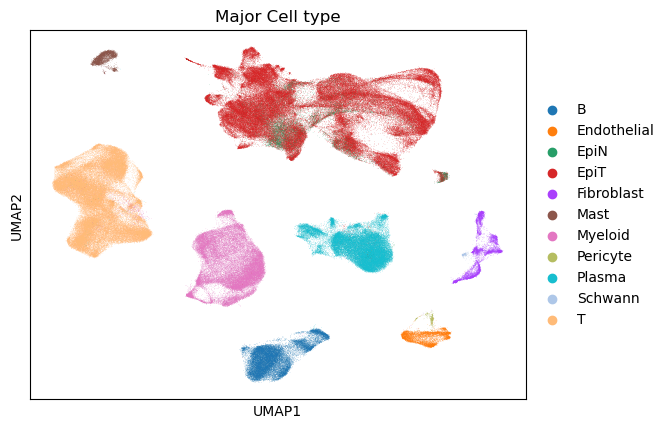

In [17]:
sc.pl.umap(adata, color='Major Cell type') #"Major Cell type": cell type attribute in adata.obs

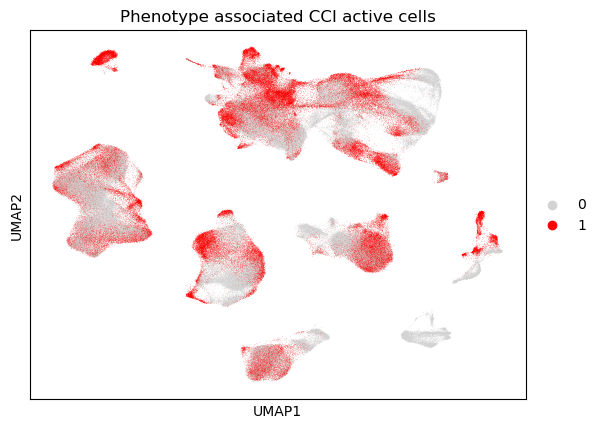

In [18]:
pc.getPosipotentialCCI(adata, CCcomm, threshold_percent=60) #The 40%(100-60%) of cells with the strongest positive correlation with COVID-19.

In some cases, PopCILA also provides a method to extract phenotype-associated CCI active cells with negative correlations to phenotype

In [ ]:
pc.getNegapotentialCCI(adata, CCcom, threshold_percent=40) #The 40% of cells with the strongest negative correlation.

After running the PopCILA.getPosipotentialCCI (or getNegapotentialCCI) method, the adata.obs will gain a new attribute called 'phe_cell'. Cells marked with a value of 1 are identified as phenotype-associated CCI active cells.

Here, we output the distribution of the fraction of PopCILA-identified phenotype-associated CCI-active cells within each cell type.

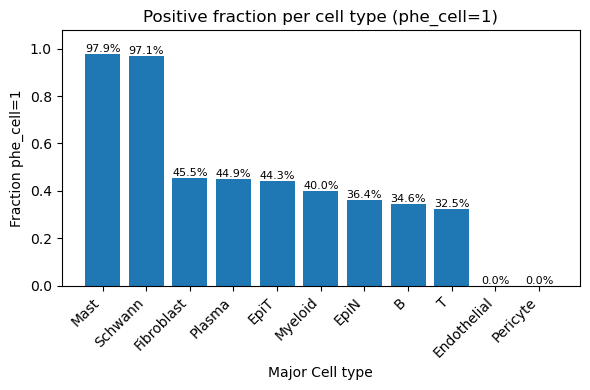

In [19]:
fig, ax, frac_table = pc.plot_positive_fraction_per_celltype(
    adata,
    phe_col="phe_cell",
    celltype_col="Major Cell type",
    min_cells=0,
    positive_value='1'
)

### Identify phenotype-associated CCI

PopCILA can visualize the cells with the top highly expressed ligand-receptor genes among these active cells.

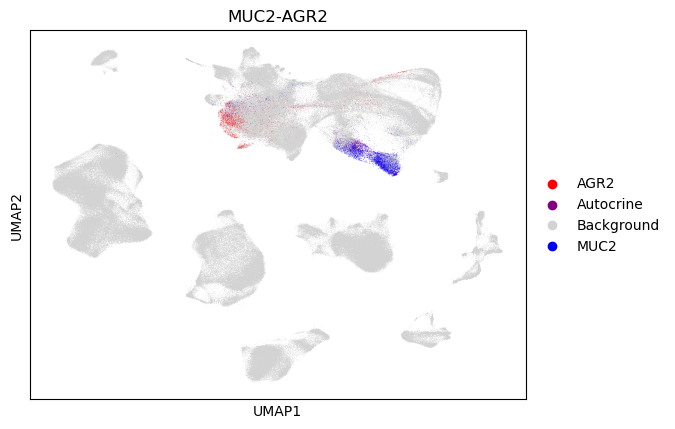

In [20]:
pc.getCCcomm(adata, 'MUC2', 'AGR2', L_threshold=5, R_threshold=5, marked_col='phe_cell')#top 5% high expression

PopCILA provides a statistical method for detecting phenotype-associated CCI events in single-cell data.

First, we extract the phenotype-associated CCI active cells. You can customize the cell types (interestcell) for your study based on the results from running PopCILA.getPosipotentialCCI (or getNegapotentialCCI) and PopCILA.plot_positive_fraction_per_celltype.

In [21]:
adata1 = adata[adata.obs['phe_cell'] == '1', :].copy()
adata1 = adata1[~adata1.obs['Major Cell type'].isna(),:]
Allcell = np.unique(adata1.obs['Major Cell type'].values).tolist()
interestcell = ['B', 'EpiN', 'EpiT', 'Fibroblast', 'Mast', 'Myeloid', 'Plasma', 'Schwann', 'T']

In [22]:
pvalues, means, sig_means, pvals_adj = pc.CCIdetect( 
    adata=adata1, celltype_key='Major Cell type', interactions=res, senders=interestcell, receivers=interestcell,
    de_enable=True, de_method='wilcoxon', de_alpha=0.05, de_logfc_min=0.1, iterations=1000, threshold=0.1, fdr_method='bh'
)

Running CCIdetect(optimized): iterations=1000, threshold=0.1, pvalue_threshold=0.05, senders=['B', 'EpiN', 'EpiT', 'Fibroblast', 'Mast', 'Myeloid', 'Plasma', 'Schwann', 'T'], receivers=['B', 'EpiN', 'EpiT', 'Fibroblast', 'Mast', 'Myeloid', 'Plasma', 'Schwann', 'T'], subsampling_fraction=1.0, de_enable=True, de_method=wilcoxon, fdr_method=bh, perm_random_state=0
DE shrink (LR space): 167 -> 112 LR pairs


CCI permutations: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:24<00:00, 11.83it/s]


### Visualizing the CCI results

We visualize the number of phenotype-associated CCIs occurring between different cell types, which can intuitively show which cells are the main participants.

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Inferred max_s (max size of scatter point) is: 287.5434833330715
Plotting legends..
Estimated legend width: 14.465277777777779 mm


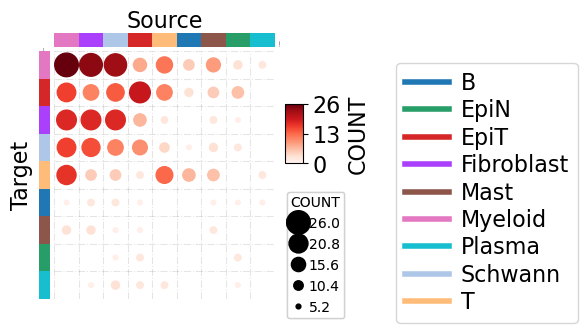

In [23]:
interaction_edges = pc.extract_interaction_edges(pvalues, alpha=0.05)
fig, ax = plt.subplots(figsize=(3,3)) 
pc.cci_heatmap(adata1[adata1.obs['Major Cell type'].isin(interestcell),:],interaction_edges,celltype_key='Major Cell type',
                   fontsize=16,target_cells = interestcell, source_cells = interestcell,
          ax=ax,legend_kws={'fontsize':16,'bbox_to_anchor':(5, -0.5),'loc':'center left',})
plt.show()

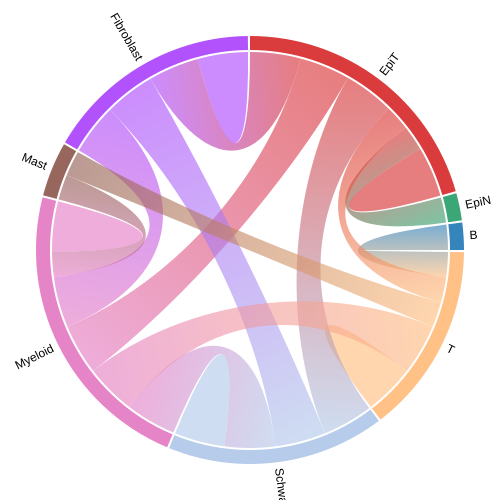

In [24]:
fig=pc.cci_chord(adata1,interaction_edges,celltype_key='Major Cell type',
          count_min=5,fontsize=12,padding=50,radius=200,save=None,) #count_min: Only shows CCI mediated by more than five specific ligand-receptor types
fig.show()

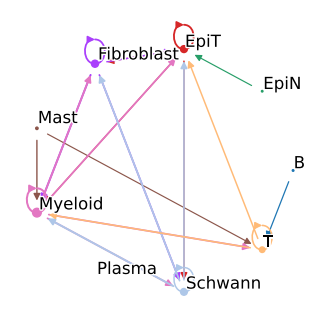

In [25]:
fig, ax = plt.subplots(figsize=(4,4)) 
pc.cci_network(adata1,interaction_edges,celltype_key='Major Cell type',
             counts_min=5, #count_min: Only shows CCI mediated by more than five specific ligand-receptor types
            nodesize_scale=5,
                  ax=ax)
plt.show()

We can visualize exactly which phenotype-associated CCI events occur among specific cell types

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Inferred max_s (max size of scatter point) is: 221.76570981646495
Plotting legends..
Estimated legend width: 25.930555555555557 mm


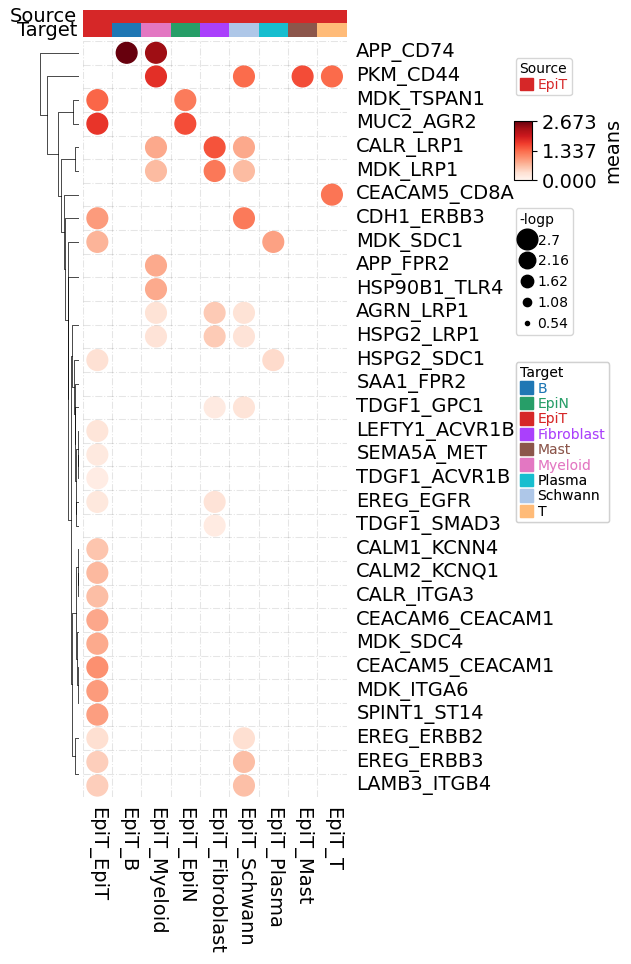

In [26]:
source_cells=['EpiT']
target_cells=interestcell
pc.cci_interacting_heatmap(adata=adata1,
                            celltype_key='Major Cell type',
                            means=means, 
                            pvalues=pvalues, 
                            source_cells=source_cells,
                            target_cells=target_cells,
                            min_means=0,
                            nodecolor_dict=None,
                            ax=None,
                            figsize=(4,9),
                            fontsize=14,)
#plt.savefig('CRC_cci_interacting_heatmap_source.png', dpi=300, bbox_inches='tight')
plt.show()

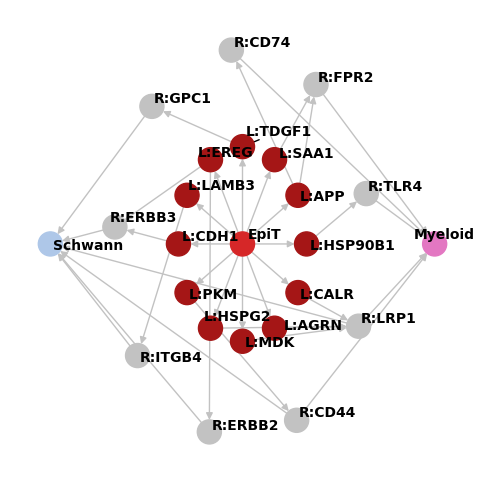

In [27]:
fig, ax = plt.subplots(figsize=(6, 6))
pc.cci_interacting_network(adata=adata1,
                            celltype_key='Major Cell type',
                            means=means,
                            source_cells=['EpiT'],
                            target_cells=['Schwann','Myeloid'],
                            means_min=0,
                            means_sum_min=0,        
                            fontsize=10,
                            ax=ax)
plt.show()

# means_sum_min:
# If the sum of interaction strengths of a given ligand-receptor pair 
# across all source-target cell pairs is greater than this threshold, 
# then this ligand-receptor pair is considered for inclusion in the network.
# (i.e., filter out globally weak ligand-receptor pairs)

# means_min:
# For a ligand-receptor pair that passes the global threshold (means_min),
# only those specific cell-cell interactions (CCI) where the interaction 
# strength exceeds this threshold will be shown in the network.
# (i.e., filter out weak CCIs even if the ligand-receptor pair is overall strong)

## Phenotype-associated intercellular signaling cascades discovery

Beyond ligand–receptor–mediated CCIs, PopCILA further resolves phenotype-associated intercellular signaling at the level of downstream transcriptional regulation by constructing and prioritizing phenotype-associated ligand–receptor–transcription factor (L–R–TF) signaling cascades and mapping them back to specific cell and tissue contexts.

In single-cell data, PopCILA starts from phenotype-associated CCI-active cells and integrates curated ligand-receptor-TF-target knowledge databases to infer putative transcriptional programs activated in receiver cells, thereby generating candidate L–R–TF signaling chains.

In [28]:
refined_pathways, active_lists = pc.refine_signal_network(
    adata=adata1,
    lig_rec=res,
    expr_prop_thresh=0.1, #Users can adjust expr_prop_thresh to control the number of selected candidates.
    mean_expr_diff_thresh=0.3, #Users can adjust mean_expr_diff_thresh to control the number of selected candidates.
    pval_thresh=0.05,
    cell_type_field="Major Cell type",
    mode='pre',
    tau_thresh = 0.1 ##Users can adjust tau_thresh to control the number of selected candidates.
)
print("Activated ligands:", len(active_lists['ligand']))
print("Activated receptors:", len(active_lists['receptor']))
print("Activated TFs:", len(active_lists['TF']))

Activated ligands: 62
Activated receptors: 55
Activated TFs: 149


Similar to identifying phenotype-associated signals at the LR level, PopCILA applies the same approach to identify phenotype-associated signals at the L–R–TF level.

In [29]:
lrtf_expr, lrtf_expr_df = pc.filter_Bulkdata_LRTF(expr_df,refined_pathways,threshold=1)
comm_matrix_lrtf = pc.build_LRTF_communication_matrix(lrtf_expr, lrtf_expr_df)
comm_matrix_lrtf = comm_matrix_lrtf[comm_matrix.columns]
optimal_K = pc.select_k_components(X = comm_matrix_lrtf.T.values.astype(float), S=S, lambda_pheno=0.10, lambda_en=0.05, eii_tol = 0.05,verbose=True)

[K=2] recon_err=0.434120
[K=3] recon_err=0.358213
[K=4] recon_err=0.303110
   eii=0.4206
[K=5] recon_err=0.268040
   eii=0.2112
[K=6] recon_err=0.242999
   eii=0.1310
[K=7] recon_err=0.218702
   eii=0.1128
[K=8] recon_err=0.200645
   eii=0.0773
[K=9] recon_err=0.184795
   eii=0.0636
[K=10] recon_err=0.172148
   eii=0.0483
[Elbow] Stop at K=10, select K=9


Then, we execute PopCILA to perform phenotype-guided decomposition of the signaling potential matrix to identify specific L-R-TF signaling patterns.

In [30]:
W_lrtf, H_lrtf, hist = pc.LRcommMining(X = comm_matrix_lrtf.T.values.astype(float), S=S, n_components=optimal_K, rho=0.75, lambda_pheno=0.10, lambda_en=0.05,maxiter=8000)

[Balance] alpha=0.126368, beta=0.0130893 (targets: pheno=0.1, en=0.05)
Iteration 0/8000, Loss: 0.220118
Iteration 200/8000, Loss: 0.215471
Iteration 400/8000, Loss: 0.212126
Iteration 600/8000, Loss: 0.209335
Iteration 800/8000, Loss: 0.206945
Iteration 1000/8000, Loss: 0.204907
Iteration 1200/8000, Loss: 0.203263
Iteration 1400/8000, Loss: 0.201961
Iteration 1600/8000, Loss: 0.200892
Iteration 1800/8000, Loss: 0.200000
Iteration 2000/8000, Loss: 0.199258
Iteration 2200/8000, Loss: 0.198656
Iteration 2400/8000, Loss: 0.198173
Iteration 2600/8000, Loss: 0.197789
Iteration 2800/8000, Loss: 0.197483
Iteration 3000/8000, Loss: 0.197245
Early stopped at iter 3068 (patience=20)


Using the association analysis provided by PopCILA, we can evaluate which patterns are more relevant to the phenotypes of interest.

For binary phenotype, run the following code:

In [31]:
phenotype_types = {"tissue_type_num": "binary"} #The column name of the phenotype in sorted_clin_df: The type of the phenotype ("binary","continuous","ordinal")

For continuous phenotype, run the following code:

In [ ]:
phenotype_types = {"HFD-45": "continuous"} #The column name of the phenotype in sorted_clin_df: The type of the phenotype ("binary","continuous","ordinal")

For ordinal phenotype, run the following code:

In [ ]:
phenotype_types = {"ajcc_pathologic_stage.diagnoses": "ordinal"}  #The column name of the phenotype in sorted_clin_df: The type of the phenotype ("binary","continuous","ordinal")                 

For survival phenotype, run the following code:

In [ ]:
phenotype_types = {"completerank": "continuous"}#The column name of the phenotype in sorted_clin_df: The type of the phenotype ("binary","continuous","ordinal")

**Note:** The completerank attribute is a linear variable derived from OS and OS.time using the PopCILA.getProgConstraint function, and it is stored in clin_df.

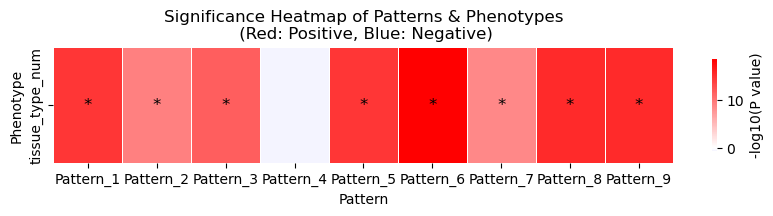

In [32]:
result = pc.Singleassociationanalysis(W_lrtf, clin_df, phenotype_types)
pc.plot_significance_heatmap(result)

For binary phenotype and ordinal, PopCILA’s association analysis additionally integrates complementary evidence from
visualization-based analyses

We visualize the distribution of pattern scores for each signaling pattern obtained from the PopCILA. 

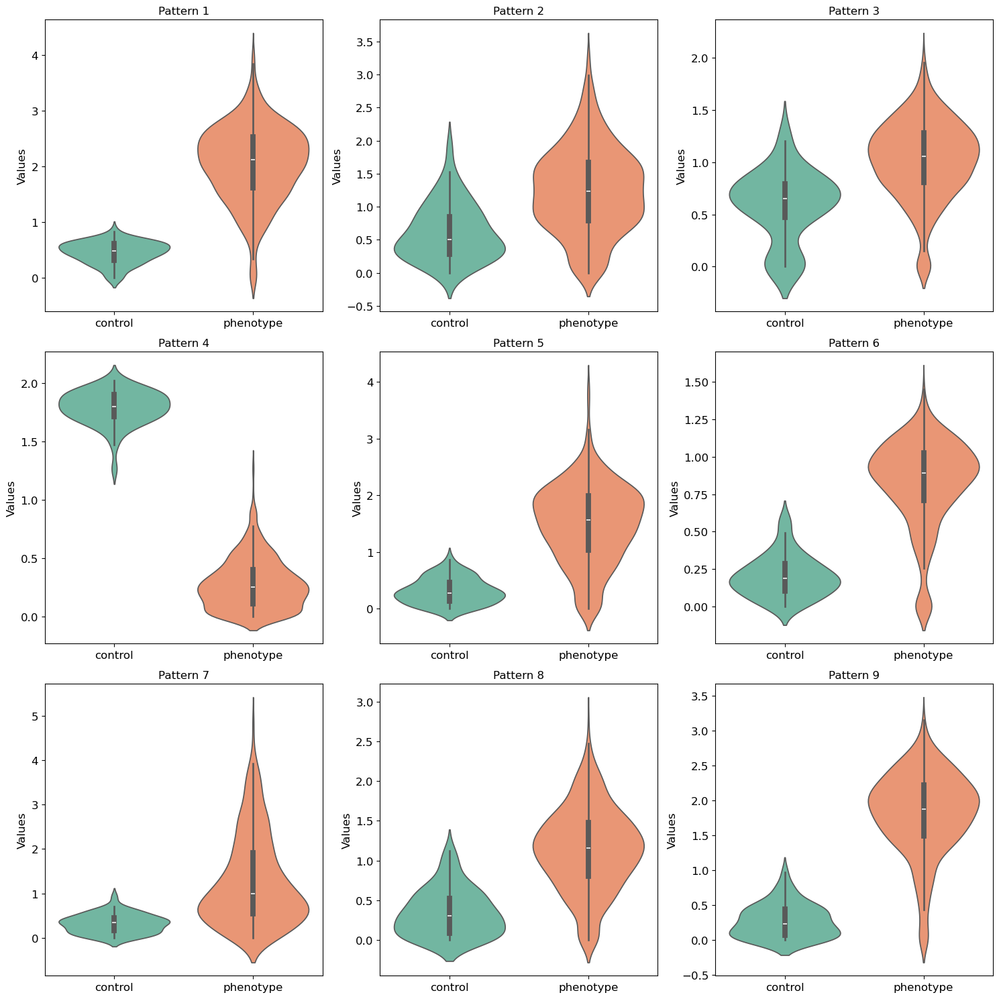

In [33]:
pc.getPatternDistribution(W_lrtf, phenotype_interval = phenotype_interval)

We recommend users to identify phenotype-asscoiated patterns by combining PopCILA's association analysis with visualization results.

In [34]:
res_lrtf= pc.getLRTFcomm(W_lrtf,H_lrtf,comm_matrix_lrtf,patterns = [1,2,3,5,6,7,8,9], lr_expr_pairs = lrtf_expr, zscore_threshold = 3.5)

**Note:** Users can flexibly adjust zscore_threshold to control the number of L–R–TF triplets identified by PopCILA. By default, PopCILA sets zscore_threshold = 2.

In [35]:
pc.plot_sankey_LRTF(res_lrtf, width=800, height=1000,thickness=80,font_size=15)

Finally, PopCILA generate sender–ligand–receiver–receptor–TF cascade networks, integrating statistical evidence of intercellular interactions to highlight putative signaling routes between cell types

In [36]:
refined_pathways2, active_lists2 = pc.refine_signal_network(
    adata=adata1,
    lig_rec=res_lrtf,
    expr_prop_thresh=0.1,
    mean_expr_diff_thresh=0.3,
    pval_thresh=0.05,
    cell_type_field="Major Cell type",
    mode='after',
    cci_pvalues = pvalues,
    tau_thresh = 0.1,
    TF_p_adj= True,
    rec_p_adj= True,
)

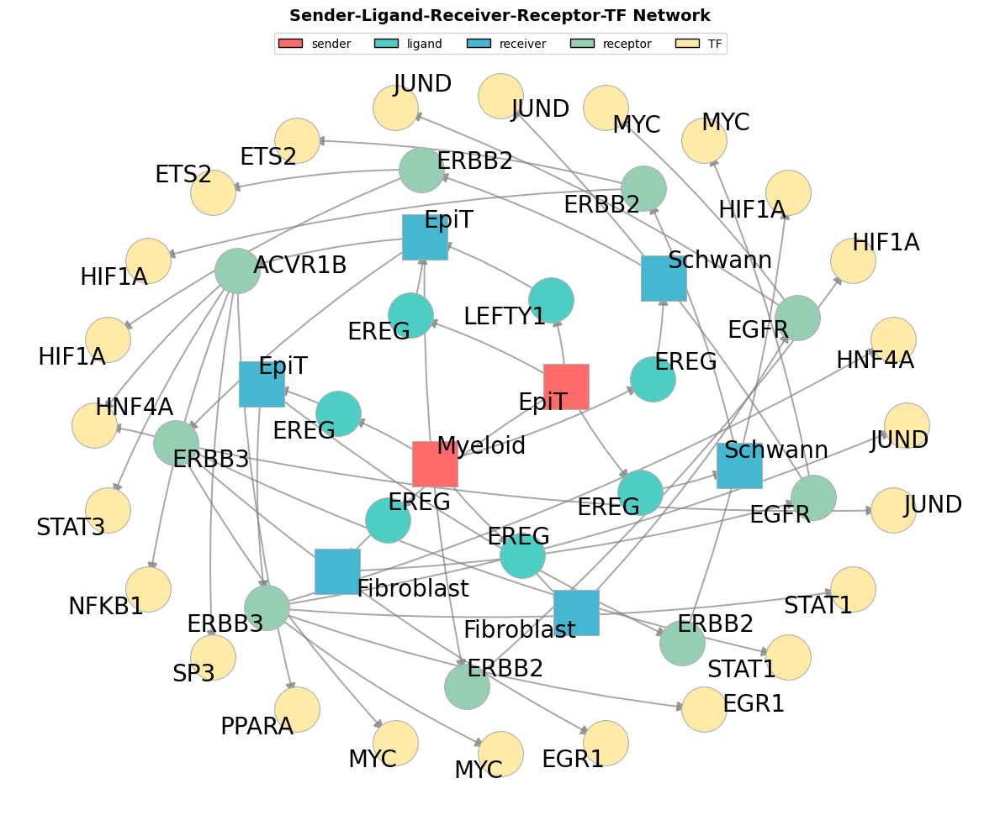

<Axes: title={'center': 'Sender-Ligand-Receiver-Receptor-TF Network'}>

In [37]:
pc.plot_LRTF_network(refined_pathways2,node_size=1500,fontsize=20)

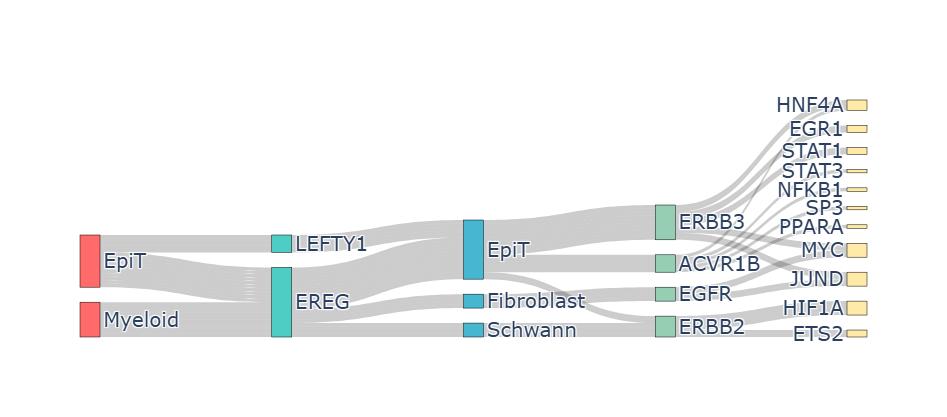

In [38]:
pc.plot_LRTF_network_sankey(refined_pathways2,fontsize=20,width=1000, height=400)